%%capture
!pip install scanpy
!pip install KDEpy
!pip install leidenalg

In [1]:
import os
import sys

import pandas as pd
import scanpy as sc
import anndata as ad
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.sparse as sps
from scipy.stats import spearmanr

# to be able to import from tools dir
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)

# os.environ['R_HOME'] = "/Library/Frameworks/R.framework/Resources"
# import pertpy as pt
    
import tools.util_probe as up
import tools.util as ut
import tools.NB_est as nb
import tools.countsplit as cs
import tools.scDEED as scd
import tools.clustering_opt as co
import tools.util_plot as nmd_plot
from tools import NMD as nmd

import warnings
warnings.filterwarnings("ignore")

from scipy.stats import kendalltau
import importlib

In [2]:
def plot_reconstruction(
    X_reconstruction, X, title,hue=None, type="scatter", sample_fraction=None
):
    """Plot original sparse non-negative matrix against the reconstructed one

    Also computes the Pearson correlation between both

    Args:
        X_reconstruction (_type_): Reconstructed matrix, e.g. np.maximum(0, Theta)
        X (_type_): The original sparse non-negative matrix
        title (_type_): _description_
        type (str, optional): _description_. Defaults to "scatter".
        sample_fraction (_type_, optional): _description_. Defaults to None.
    """
    X_recon_max = np.max(X_reconstruction)
    X_max = np.max(X)
    max_axis = max(X_recon_max, X_max)
    correlation = np.corrcoef(X_reconstruction.flatten(), X.flatten())[0][1]

    df = pd.DataFrame(
        {"original": X.flatten(), "reconstruction": X_reconstruction.flatten()}
    )

    if sample_fraction:
        df = df.sample(frac=sample_fraction, axis=0)

    fig, ax = plt.subplots()
    match type:
        case "scatter":
            if hue is not None:
                p = sns.scatterplot(data=df, x="reconstruction", y="original", hue=hue, alpha=0.1)
            else:
                p = sns.scatterplot(data=df, x="reconstruction", y="original", alpha=0.1)
        # case "kde":
        # p = sns.kdeplot(X_reconstruction.flatten(), X.flatten())
        # p = sns.kdeplot(data=df, x="reconstruction", y="original")
    p.set_ylim(0, max_axis)
    p.set_xlim(0, max_axis)
    plt.suptitle(title)
    plt.title(f"Pearson correlation: {round(correlation, 3)}")
    plt.xlabel("Reconstruction")
    plt.ylabel("Original data")
    ax.axline(xy1=(0, 0), slope=1, linewidth=1, color="r")
    plt.show()


In [3]:
data_all_pca = sc.read_h5ad("../../data/MOBA_scRNAseq/MOBA_intermediate_results/export_s3.h5ad")
data_all_pca

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'total_counts', 'n_genes_by_counts', 'leiden_opt'
    var: 'total_counts', 'n_cells_by_counts', 'TU_ID', 'nb_overdisp_cutoff', 'pval_cluster_0', 'pval_cluster_1', 'pval_cluster_2', 'pval_cluster_3'
    uns: 'leiden', 'leiden_opt_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [4]:
data_all_pca.varm["PCs"].shape

(5553, 50)

In [5]:
data_counts = sc.read_h5ad("../../data/MOBA_scRNAseq/MOBA_intermediate_results/S3_filtered_with_counts.h5ad")
data_counts

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'vst_counts'

In [6]:
importlib.reload(nmd_plot)

<module 'tools.util_plot' from '/dss/dsshome1/07/di35buw/NMD/BacSC/tools/util_plot.py'>

In [16]:
data_all_pca.uns["leiden_opt_colors"]

array(['#1f77b4', '#d62728', '#e377c2', '#17becf'], dtype=object)

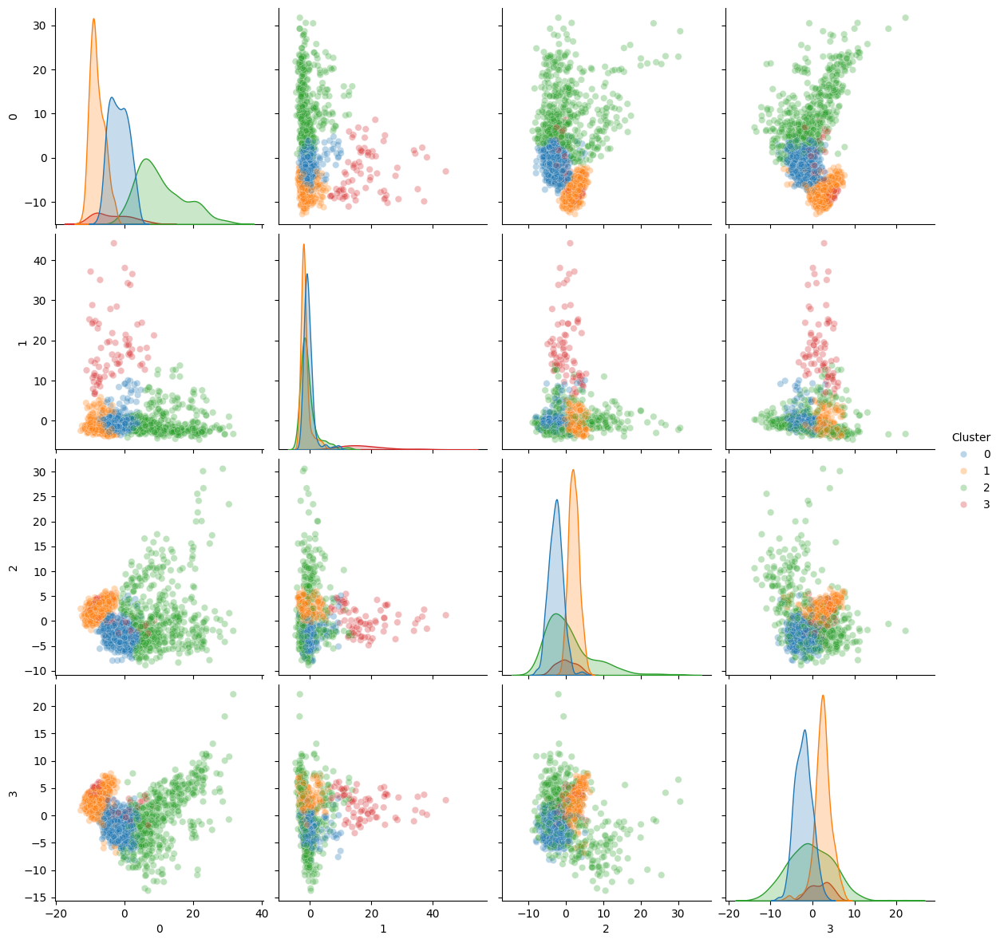

In [17]:
nmd_plot.plot_embedding_grid(data_all_pca.obsm["X_pca"][:,:4], hue=data_all_pca.obs["leiden_opt"], size=3)

In [7]:
data_counts.X = data_counts.layers["counts"].copy()

In [8]:
# Normalizes X, such that: each barcode has total count equal to median of total counts before normalization
sc.pp.normalize_total(data_counts, target_sum=None, layer=None)

# Only normalization
data_counts.layers["normalized_counts"] = data_counts.X.copy()


In [ ]:
data_counts.layers["normalized_counts"].to_excel()

## Fit NMD

In [20]:
k_opt = 2 # to match pca
beta_opt = 0.4
data_layer = "normalized_counts"

In [21]:
m, n = data_counts.X.shape
X_nmd = ut.convert_to_dense_counts(data_counts, layer=data_layer)
m, n = X_nmd.shape
W0, H0 = cs.nuclear_norm_init(X_nmd, m, n, k_opt)
Theta0 = W0 @ H0

In [22]:
Theta_3b, W_3b, H_3b, loss_3b, iters_3b, times_3b = nmd.nmd_3b(X_nmd, r=k_opt, W0=W0, H0=H0, beta1=beta_opt, tol_over_10iters=1e-4)

Running 3B-NMD, evolution of [iteration number : relative error in %] - time per iteration
[0 : 68.956017] - 0.649808 secs
[1 : 68.105124] - 0.646729 secs
[2 : 67.538225] - 0.637627 secs
[3 : 67.316624] - 0.642688 secs
[4 : 67.216164] - 0.662885 secs
[5 : 67.164610] - 0.654845 secs
[6 : 67.133102] - 0.642524 secs
[7 : 67.110522] - 0.636297 secs
[8 : 67.093939] - 0.647971 secs
[9 : 67.081692] - 0.636454 secs
[10 : 67.071890] - 0.636621 secs
[11 : 67.063760] - 0.641135 secs
[12 : 67.056879] - 0.640141 secs
[13 : 67.050881] - 0.652472 secs
[14 : 67.045582] - 0.629019 secs
[15 : 67.040884] - 0.637775 secs
[16 : 67.036616] - 0.649594 secs
[17 : 67.032657] - 0.637930 secs
[18 : 67.028908] - 0.639055 secs
[19 : 67.025309] - 0.654418 secs
[20 : 67.021807] - 0.645002 secs
[21 : 67.018372] - 0.636575 secs
[22 : 67.014967] - 0.656853 secs
[23 : 67.011600] - 0.643485 secs
[24 : 67.008229] - 0.666248 secs
[25 : 67.004845] - 0.684965 secs
[26 : 67.001419] - 0.635067 secs
[27 : 66.997940] - 0.635162 

In [23]:
importlib.reload(nmd_plot)

<module 'tools.util_plot' from '/dss/dsshome1/07/di35buw/NMD/BacSC/tools/util_plot.py'>

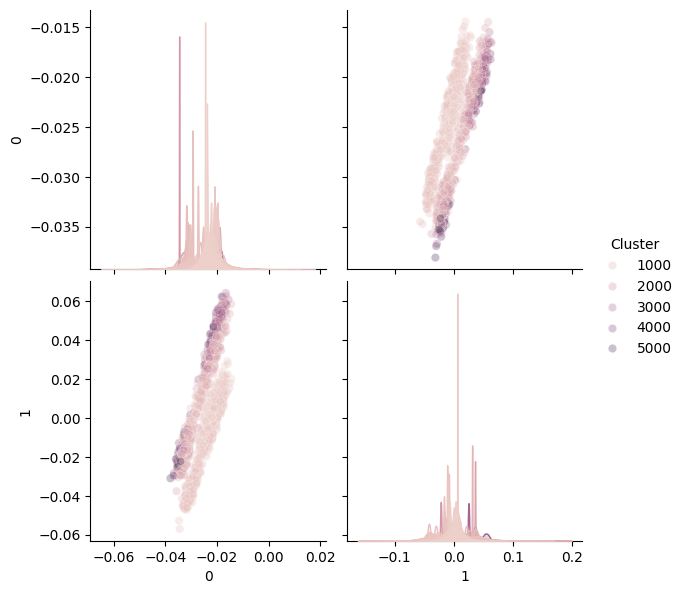

In [24]:
nmd_plot.plot_embedding_grid(W0, hue=data_counts.obs["total_counts"], size=3)

In [27]:
def plot_reconstruction(
    X_reconstruction, X,hue=None, type="scatter", sample_fraction=None
):
    """Plot original sparse non-negative matrix against the reconstructed one

    Also computes the Pearson correlation between both

    Args:
        X_reconstruction (_type_): Reconstructed matrix, e.g. np.maximum(0, Theta)
        X (_type_): The original sparse non-negative matrix
        title (_type_): _description_
        type (str, optional): _description_. Defaults to "scatter".
        sample_fraction (_type_, optional): _description_. Defaults to None.
    """
    X_recon_max = np.max(X_reconstruction)
    X_max = np.max(X)
    max_axis = max(X_recon_max, X_max)
    #correlation = np.corrcoef(X_reconstruction.flatten(), X.flatten())[0][1]

    df = pd.DataFrame(
        {"original": X.flatten(), "reconstruction": X_reconstruction.flatten().round(0)}
    )
    
    correlation = kendalltau(df["original"], df["reconstruction"]).statistic

    if sample_fraction:
        df = df.sample(frac=sample_fraction, axis=0)

    fig, ax = plt.subplots()
    match type:
        case "scatter":
            if hue is not None:
                p = sns.scatterplot(data=df, x="reconstruction", y="original", hue=hue, alpha=0.05)
            else:
                p = sns.scatterplot(data=df, x="reconstruction", y="original", alpha=0.05)
        # case "kde":
        # p = sns.kdeplot(X_reconstruction.flatten(), X.flatten())
        # p = sns.kdeplot(data=df, x="reconstruction", y="original")
    #p.set_ylim(0, max_axis)
    #p.set_xlim(0, max_axis)
    #plt.suptitle(title)
    plt.title(f"Kendall's tau: {round(correlation, 3)}")
    plt.xlabel("Reconstruction")
    plt.ylabel("Original data")
    ax.axline(xy1=(0, 0), slope=1, linewidth=1, color="r")
    plt.show()


In [34]:
X_nmd.min()

0

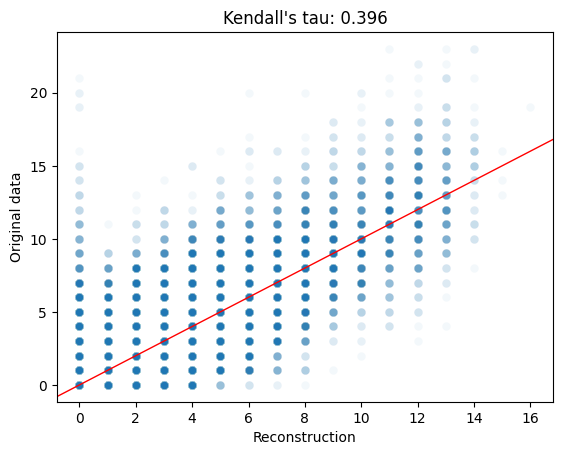

In [29]:
plot_reconstruction(np.maximum(0, W0@H0), X_nmd)

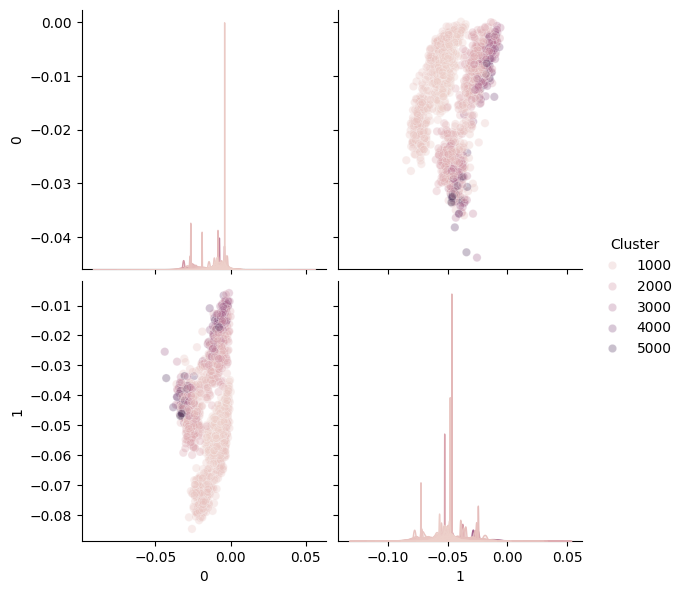

In [30]:
nmd_plot.plot_embedding_grid(W_3b, hue=data_counts.obs["total_counts"], size=3)

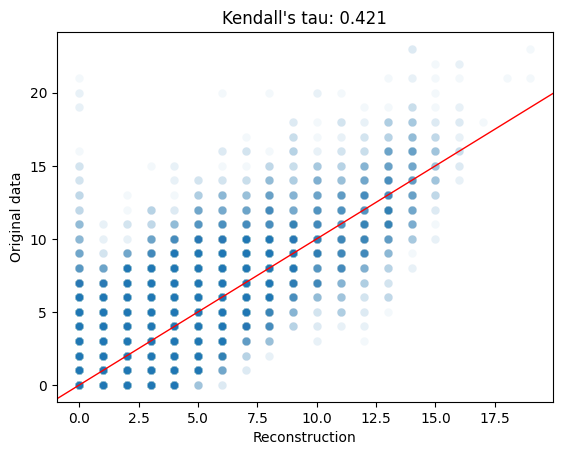

In [31]:
plot_reconstruction(np.maximum(0, W_3b@H_3b), X_nmd)

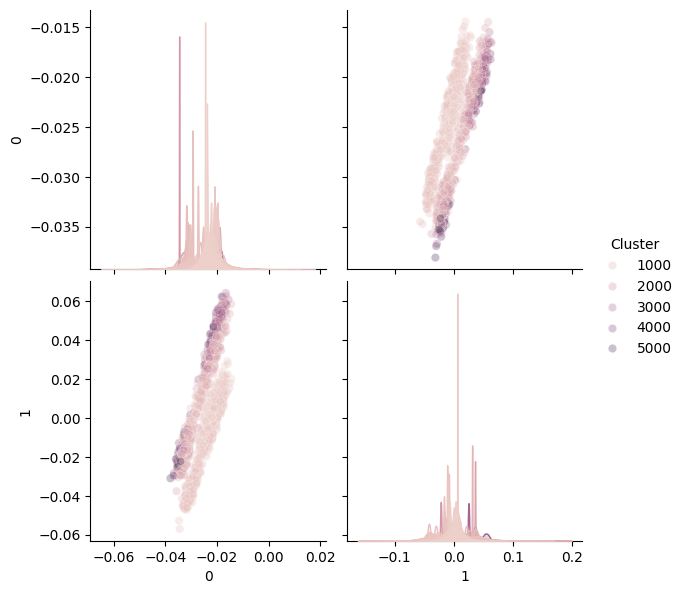

In [38]:
nmd_plot.plot_embedding_grid(W0, hue=data_counts.obs["total_counts"], size=3)

In [39]:
data_train, data_test = cs.countsplit_adata(data_counts, data_dist="NB", beta_key="nb_overdisp_cutoff", layer="normalized_counts", min_genes=1, max_counts=1e9, seed=1234)

In [40]:
data_counts.obsm["X_3b"] = W_3b.copy()

In [31]:
importlib.reload(scd)

n_neighborss = [10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 150, 200, 250]
min_dists = [0.05, 0.1, 0.3, 0.5, 0.7]

scdeed_result, rel_scores, null_rel_scores, reliabilities, n_neighbors_opt, min_dist_opt = scd.scdeed_parameter_selection(
    data_counts, n_neighborss, min_dists, n_pcs=k_opt, rng_seed=5678, layer = "normalized_counts",
    embedding_method="UMAP", similarity_percent=0.5, save_path="S2_filtered_scdeed_nmd")

calculating (10, 0.05) - run 1/85


2024-03-15 14:26:45.284207: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9373] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-15 14:26:45.284304: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-15 14:26:45.287819: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1534] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-15 14:26:45.303901: I tensorflow/core/platform/cpu_feature_guard.cc:183] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE3 SSE4.1 SSE4.2 AVX, in other operations, rebuild TensorFlow with the appropriate compiler flags.


calculating (10, 0.1) - run 2/85
calculating (10, 0.3) - run 3/85
calculating (10, 0.5) - run 4/85
calculating (10, 0.7) - run 5/85
calculating (15, 0.05) - run 6/85
calculating (15, 0.1) - run 7/85
calculating (15, 0.3) - run 8/85
calculating (15, 0.5) - run 9/85
calculating (15, 0.7) - run 10/85
calculating (20, 0.05) - run 11/85
calculating (20, 0.1) - run 12/85
calculating (20, 0.3) - run 13/85
calculating (20, 0.5) - run 14/85
calculating (20, 0.7) - run 15/85
calculating (25, 0.05) - run 16/85
calculating (25, 0.1) - run 17/85
calculating (25, 0.3) - run 18/85
calculating (25, 0.5) - run 19/85
calculating (25, 0.7) - run 20/85
calculating (30, 0.05) - run 21/85
calculating (30, 0.1) - run 22/85
calculating (30, 0.3) - run 23/85
calculating (30, 0.5) - run 24/85
calculating (30, 0.7) - run 25/85
calculating (35, 0.05) - run 26/85
calculating (35, 0.1) - run 27/85
calculating (35, 0.3) - run 28/85
calculating (35, 0.5) - run 29/85
calculating (35, 0.7) - run 30/85
calculating (40, 

Optimal number of neighbors: 25
Optimal min_dist: 0.3


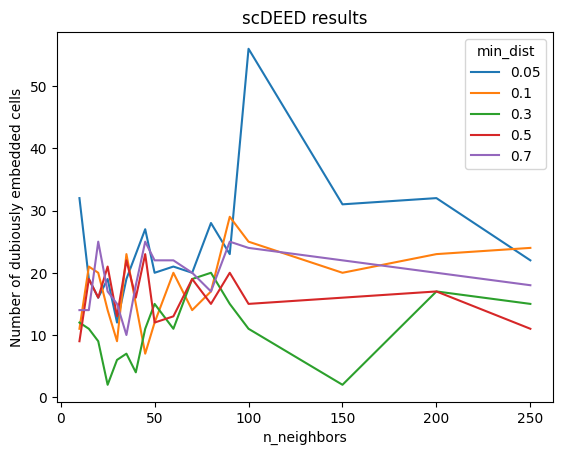

In [32]:
print(f"Optimal number of neighbors: {n_neighbors_opt}")
print(f"Optimal min_dist: {min_dist_opt}")

sns.lineplot(data=scdeed_result, x="n_neighbors", y="num_dubious", hue="min_dist", palette="tab10")
plt.title("scDEED results")
plt.ylabel("Number of dubiously embedded cells")
plt.show()

In [60]:
n_neighbors_opt=50
min_dist_opt=0.7

In [62]:
k_opt

2

In [61]:
sc.pp.neighbors(data_counts, n_neighbors=n_neighbors_opt, n_pcs=k_opt, use_rep="X_3b")
sc.tl.umap(data_counts, neighbors_key="neighbors", min_dist=min_dist_opt, spread=1)

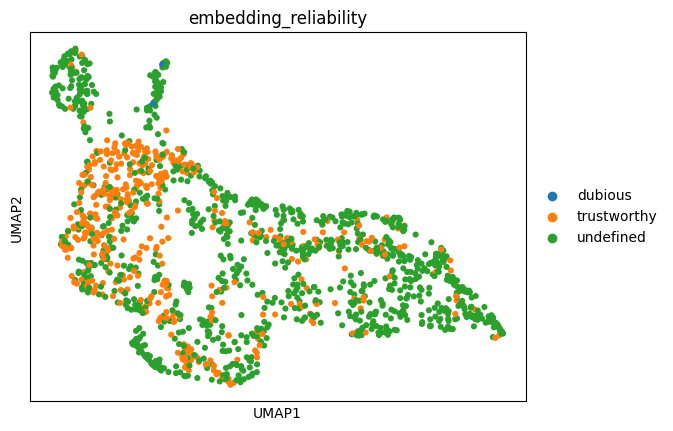

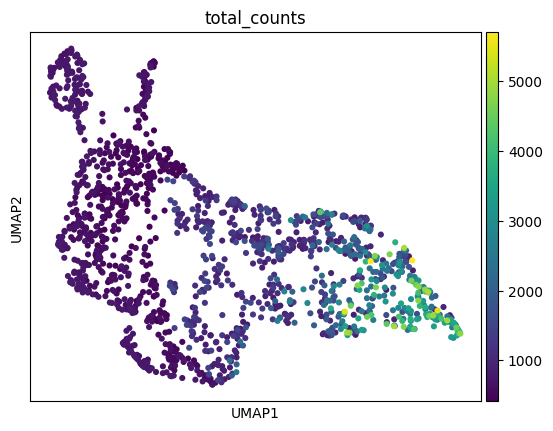

In [34]:
sc.pl.umap(data_counts, color="embedding_reliability", alpha=1)
plt.show()

sc.pl.umap(data_counts, color="total_counts", alpha=1, cmap="viridis")
plt.show()

In [41]:
# Normalizes X, such that: each barcode has total count equal to median of total counts before normalization
sc.pp.normalize_total(data_train, target_sum=None, layer=None)

# Only normalization
data_train.layers["normalized_counts"] = data_train.X.copy()

# Variance Stabilization Transformation
data_train.X = sps.csr_matrix(np.log(data_train.X.toarray() + np.array(data_train.var["nb_overdisp_cutoff"] / 4)))
data_train.layers["vst_counts"] = data_train.X.copy()
data_train.layers["vst_counts_shifted"] = data_train.layers["vst_counts"].copy().todense() + data_train.layers["vst_counts"].min() * -1.

# test data
sc.pp.normalize_total(data_test, target_sum=None, layer=None)
data_test.layers["normalized_counts"] = data_test.X.copy()
data_test.X = sps.csr_matrix(np.log(data_test.X.toarray() + np.array(data_test.var["nb_overdisp_cutoff"] / 4)))
data_test.layers["vst_counts"] = data_test.X.copy()
data_test.layers["vst_counts_shifted"] = data_test.layers["vst_counts"].copy().todense() + data_test.layers["vst_counts"].min() * -1.

In [42]:
X_train = ut.convert_to_dense_counts(data_train, layer=data_layer)
m, n = X_train.shape
W0_train, H0_train = cs.nuclear_norm_init(X_train, m, n, k_opt)

In [43]:
X_test = ut.convert_to_dense_counts(data_test, layer=data_layer)
m, n = X_test.shape
W0_test, H0_test = cs.nuclear_norm_init(X_test, m, n, k_opt)

In [44]:
_, W_train, H_train,  _, _, _ = nmd.nmd_3b(X_train, r=k_opt, W0=W0_train, H0=H0_train, beta1=.8)

Running 3B-NMD, evolution of [iteration number : relative error in %] - time per iteration
[0 : 77.027609] - 0.576294 secs
[1 : 76.957247] - 0.563699 secs
[2 : 76.945276] - 0.575436 secs
[3 : 76.990732] - 0.575270 secs
[4 : 76.945911] - 0.570876 secs
[5 : 76.827254] - 0.565253 secs
[6 : 76.855174] - 0.571957 secs
[7 : 76.808463] - 0.574301 secs
[8 : 76.745051] - 0.570291 secs
[9 : 76.798317] - 0.564609 secs
[10 : 76.783406] - 0.570682 secs
[11 : 76.752841] - 0.579685 secs
[12 : 76.775102] - 0.569630 secs
[13 : 76.715538] - 0.562533 secs
[14 : 76.667577] - 0.576654 secs
[15 : 76.669858] - 0.578935 secs
[16 : 76.608537] - 0.564766 secs
[17 : 76.560009] - 0.559190 secs
[18 : 76.573549] - 0.574837 secs
[19 : 76.515124] - 0.577851 secs
[20 : 76.483396] - 0.570580 secs
[21 : 76.508686] - 0.581702 secs
[22 : 76.450347] - 0.571447 secs
[23 : 76.415777] - 0.581441 secs
[24 : 76.451653] - 0.567986 secs
[25 : 76.378066] - 0.560679 secs
[26 : 76.333629] - 0.573888 secs
[27 : 76.376106] - 0.577071 

In [45]:
_, W_test, H_test,  _, _, _ = nmd.nmd_3b(X_test, r=k_opt, W0=W0_test, H0=H0_test, beta1=.8)

Running 3B-NMD, evolution of [iteration number : relative error in %] - time per iteration
[0 : 77.655633] - 0.573391 secs
[1 : 77.584127] - 0.575188 secs
[2 : 77.565559] - 0.576945 secs
[3 : 77.608817] - 0.569734 secs
[4 : 77.564066] - 0.566665 secs
[5 : 77.468706] - 0.564554 secs
[6 : 77.450178] - 0.579614 secs
[7 : 77.425884] - 0.561485 secs
[8 : 77.388140] - 0.565880 secs
[9 : 77.458915] - 0.590761 secs
[10 : 77.418205] - 0.574293 secs
[11 : 77.408208] - 0.571784 secs
[12 : 77.432562] - 0.572001 secs
[13 : 77.392561] - 0.568810 secs
[14 : 77.355116] - 0.580095 secs
[15 : 77.350074] - 0.596414 secs
[16 : 77.292397] - 0.572326 secs
[17 : 77.262602] - 0.594760 secs
[18 : 77.268199] - 0.579325 secs
[19 : 77.231702] - 0.580029 secs
[20 : 77.218584] - 0.576407 secs
[21 : 77.230556] - 0.566595 secs
[22 : 77.198946] - 0.571211 secs
[23 : 77.179980] - 0.585039 secs
[24 : 77.217128] - 0.572542 secs
[25 : 77.168465] - 0.570945 secs
[26 : 77.166158] - 0.590725 secs
[27 : 77.181223] - 0.569935 

In [47]:
data_train.obsm["X_3b"] = W_train
data_test.obsm["X_3b"] = W_test

In [51]:
n_neighbors_opt=50
min_dist_opt=0.7

In [52]:
sc.pp.neighbors(data_train, n_neighbors=n_neighbors_opt, n_pcs=k_opt, use_rep="X_3b")
sc.tl.umap(data_train, neighbors_key="neighbors", min_dist=min_dist_opt, spread=1)

sc.pp.neighbors(data_test, n_neighbors=n_neighbors_opt, n_pcs=k_opt, use_rep="X_3b")
sc.tl.umap(data_test, neighbors_key="neighbors", min_dist=min_dist_opt, spread=1)


theta_opt, mirror_opt, umap_2_opt, ssd = ut.find_opt_umap_rotation(data_train.obsm["X_umap"].copy(), data_test.obsm["X_umap"].copy())
data_test.obsm["X_umap_rot"] = umap_2_opt

NMD viel sensitiver auf countsplitting als PCA:

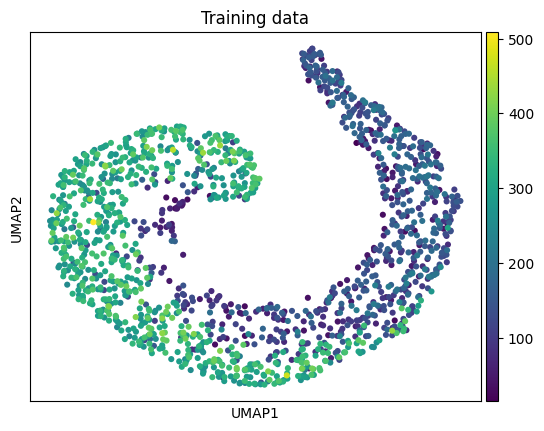

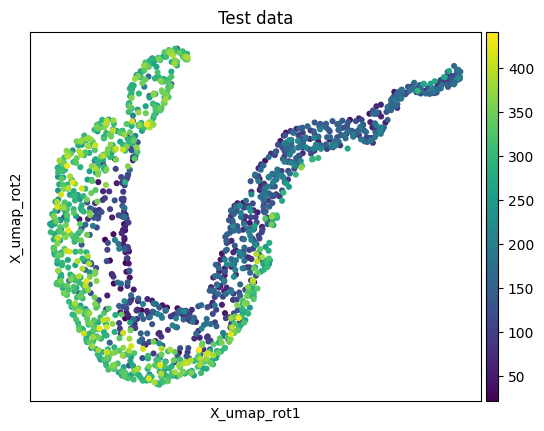

In [53]:
sc.pl.umap(data_train, color="total_counts", cmap="viridis", title="Training data")
plt.show()

sc.pl.embedding(data_test, basis="X_umap_rot", color="total_counts", cmap="viridis", title="Test data")
plt.show()

In [43]:
# !pip install leidenalg

In [54]:
importlib.reload(co)
res_min = 0.01
res_max = 0.5
res_step = 0.02
resolutions = np.round(np.arange(res_min, res_max, res_step), 2)

co.cluster_train_test(data_train, data_test, resolutions, alg="leiden")

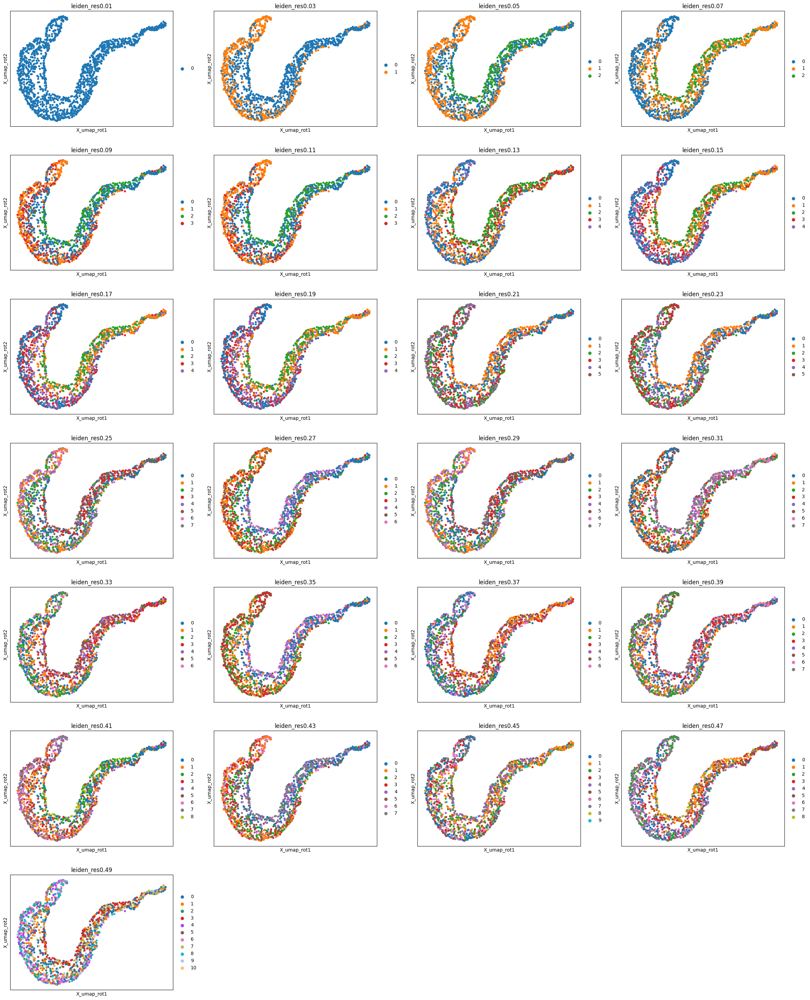

In [55]:
sc.pl.embedding(data_test, basis="X_umap_rot", color=[f"leiden_res{resolution}" for resolution in resolutions])
plt.show()

In [56]:
importlib.reload(co)
mod_df, mod_df_wide, res_opt = co.find_optimal_clustering_resolution(data_train, data_test, resolutions)

print(f"Optimal resolution {res_opt}")

resolution: 0.01 - clusters: 1 - Train: 0.49 - Test: 0.49 - Random: 0.49
resolution: 0.03 - clusters: 2 - Train: 0.478 - Test: 0.337 - Random: 0.246
resolution: 0.05 - clusters: 3 - Train: 0.469 - Test: 0.244 - Random: 0.16
resolution: 0.07 - clusters: 3 - Train: 0.458 - Test: 0.245 - Random: 0.157
resolution: 0.09 - clusters: 4 - Train: 0.449 - Test: 0.179 - Random: 0.11
resolution: 0.11 - clusters: 4 - Train: 0.444 - Test: 0.18 - Random: 0.107
resolution: 0.13 - clusters: 5 - Train: 0.442 - Test: 0.157 - Random: 0.083
resolution: 0.15 - clusters: 5 - Train: 0.434 - Test: 0.143 - Random: 0.071
resolution: 0.17 - clusters: 5 - Train: 0.43 - Test: 0.137 - Random: 0.066
resolution: 0.19 - clusters: 5 - Train: 0.426 - Test: 0.133 - Random: 0.064
resolution: 0.21 - clusters: 6 - Train: 0.421 - Test: 0.11 - Random: 0.05
resolution: 0.23 - clusters: 6 - Train: 0.417 - Test: 0.107 - Random: 0.047
resolution: 0.25 - clusters: 8 - Train: 0.415 - Test: 0.078 - Random: 0.034
resolution: 0.27 - cl

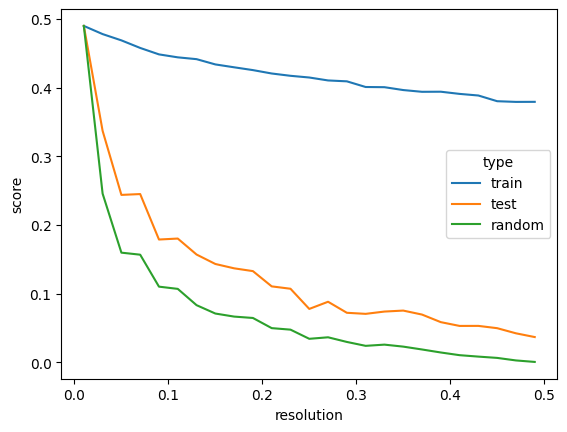

In [57]:
sns.lineplot(data=mod_df, x="resolution", y="score", hue="type")
plt.show()

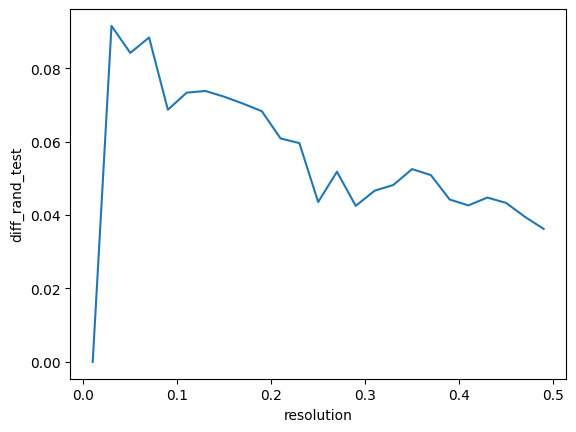

In [58]:
sns.lineplot(data=mod_df_wide, x="resolution", y="diff_rand_test")
plt.show()

In [63]:
sc.tl.leiden(data_counts, resolution=res_opt, key_added="leiden_opt")

In [50]:
data_counts

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'leiden_opt'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    uns: 'pca', 'neighbors', 'umap', 'embedding_reliability_colors', 'leiden'
    obsm: 'X_pca', 'X_3b', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'vst_counts', 'normalized_counts'
    obsp: 'distances', 'connectivities'

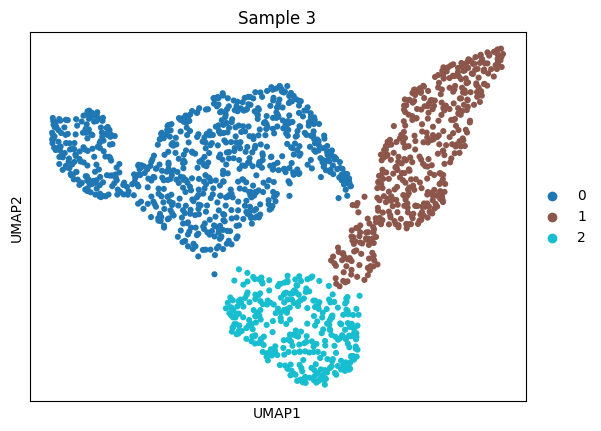

In [64]:
sc.pl.umap(data_counts, color="leiden_opt", palette="tab10", title="Sample 3")
plt.show()

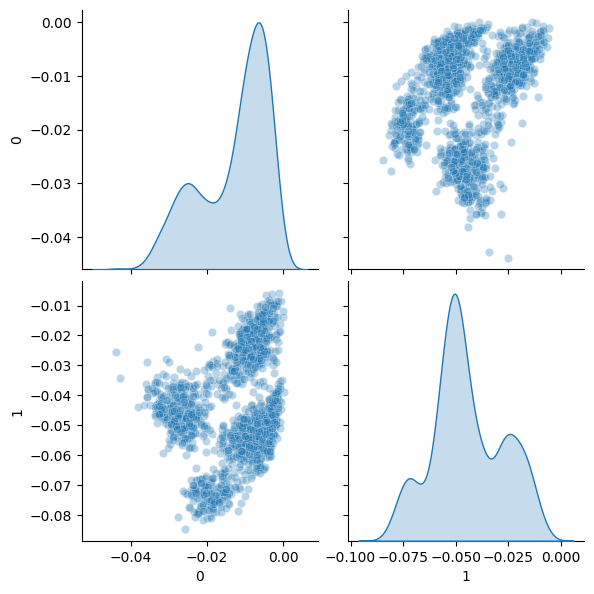

In [67]:
nmd_plot.plot_embedding_grid(W_3b, hue=None, size=3)

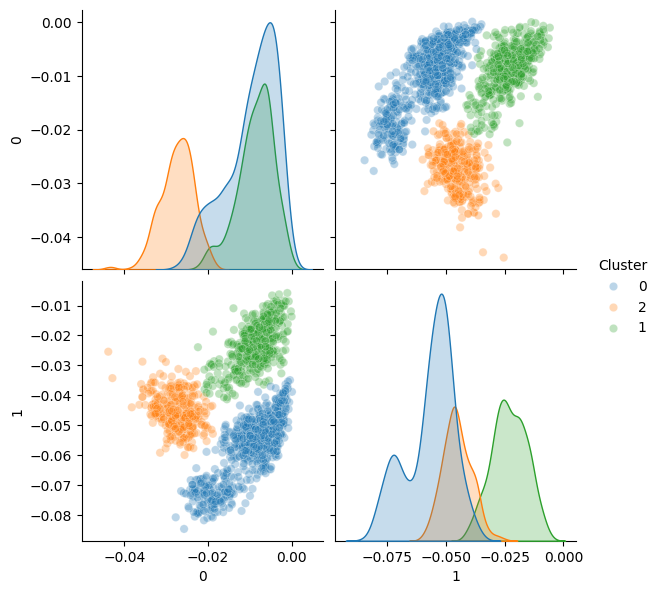

In [65]:
nmd_plot.plot_embedding_grid(data_counts.obsm["X_3b"], hue=data_counts.obs["leiden_opt"], size=3)


In [53]:
pd.crosstab(data_all_pca.obs["leiden_opt"], data_counts.obs["leiden_opt"], rownames=['PCA'], colnames=['NMD'])

NMD,0,1,2,3,4,5,6,7,8,9
PCA,,,,,,,,,,
0,221,60,116,29,9,12,55,0,8,7
1,55,77,5,70,56,59,47,8,104,1
2,33,49,63,62,82,57,19,106,0,0
3,0,0,0,16,7,0,0,4,1,46


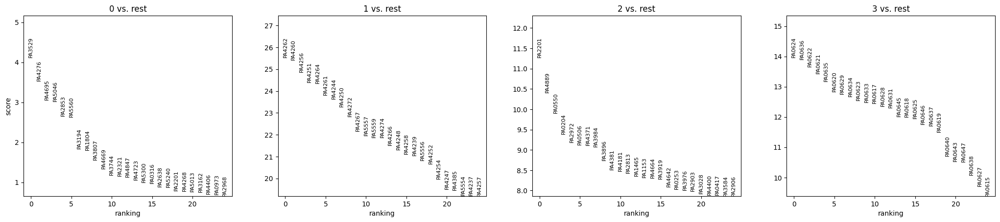

In [54]:
sc.tl.rank_genes_groups(data_all_pca, 'leiden_opt', method='wilcoxon')
sc.pl.rank_genes_groups(data_all_pca, n_genes=25, sharey=False)

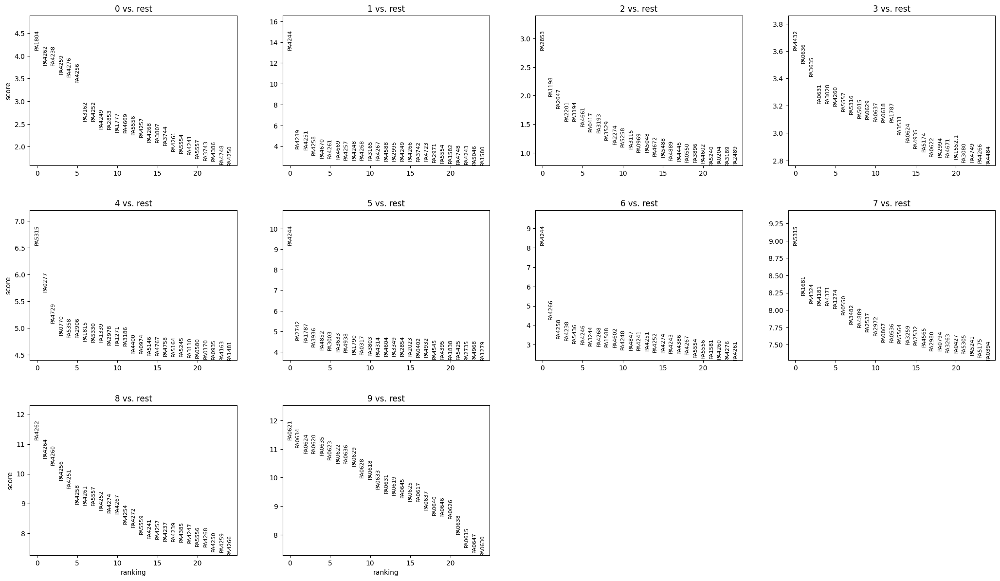

In [55]:
sc.tl.rank_genes_groups(data_counts, 'leiden_opt', method='wilcoxon')
sc.pl.rank_genes_groups(data_counts, n_genes=25, sharey=False)

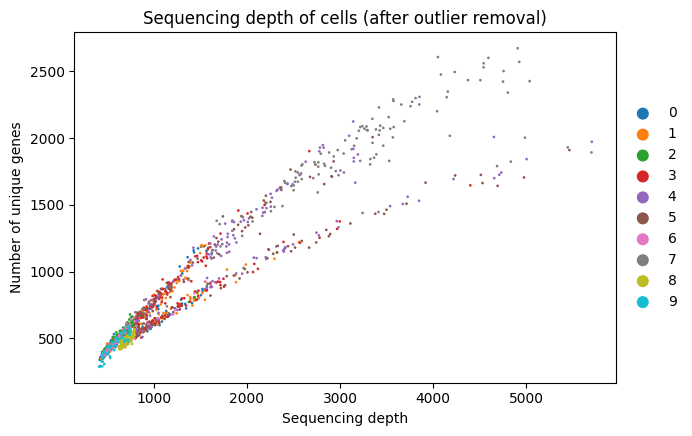

In [56]:
sc.pl.scatter(data_counts, x='total_counts', y='n_genes_by_counts', show=False, size=15, color="leiden_opt")
plt.title("Sequencing depth of cells (after outlier removal)")
plt.xlabel("Sequencing depth")
plt.ylabel("Number of unique genes")
plt.show()

In [57]:
top_genes_3 = [x[2] for x in data_counts.uns["rank_genes_groups"]["names"]]
print(top_genes_3[:25])

['PA2853', 'PA1198', 'PA2647', 'PA2201', 'PA3194', 'PA4661', 'PA0417', 'PA3193', 'PA3529', 'PA2274', 'PA5258', 'PA3115', 'PA0969', 'PA5048', 'PA4672', 'PA5488', 'PA4889', 'PA4445', 'PA0550', 'PA3896', 'PA4602', 'PA5240', 'PA0204', 'PA3189', 'PA2489']


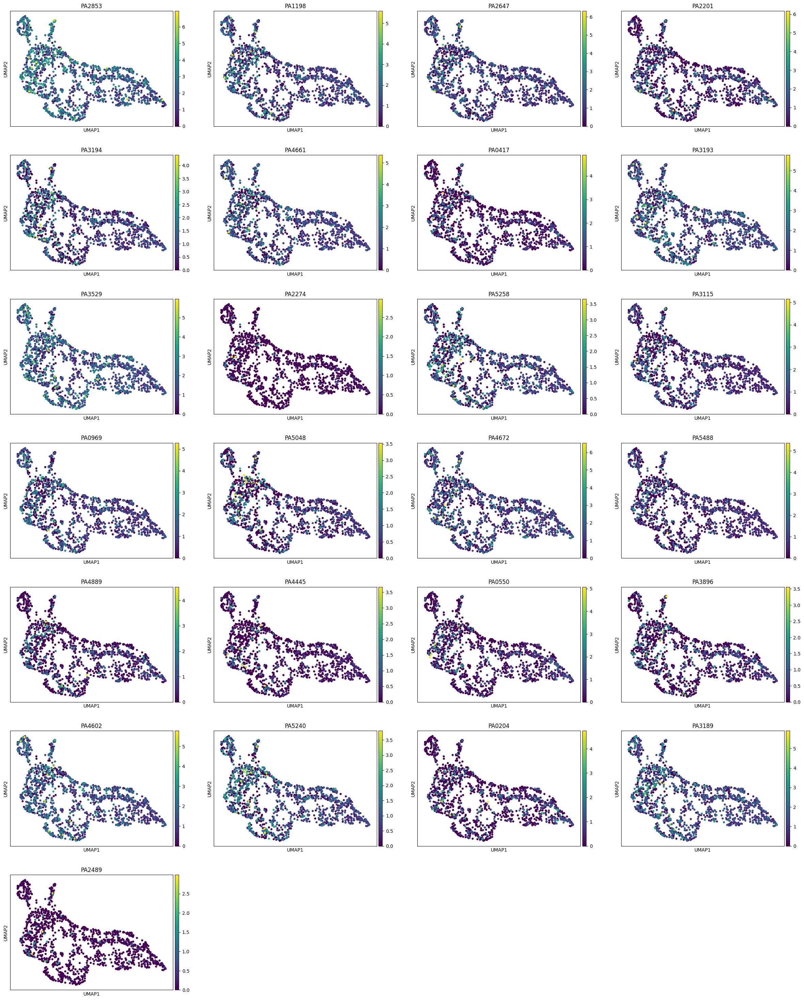

In [58]:
sc.pl.umap(data_counts, color=top_genes_3[:25], palette="tab20", cmap="viridis")

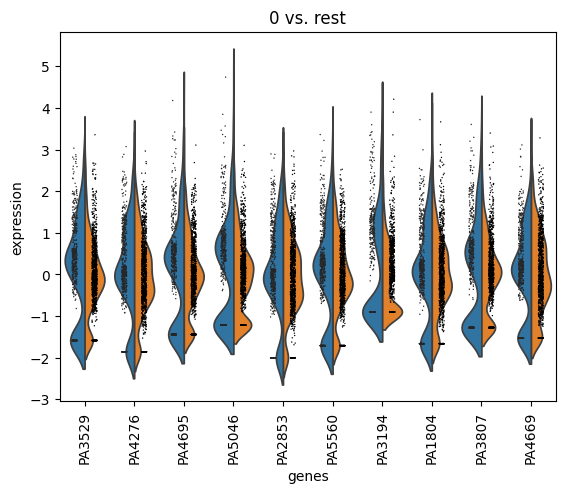

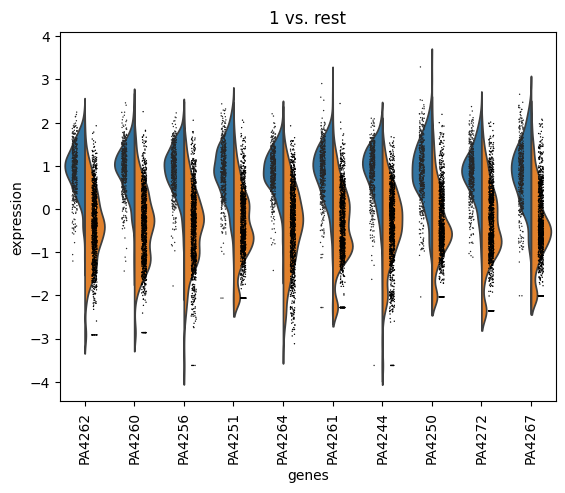

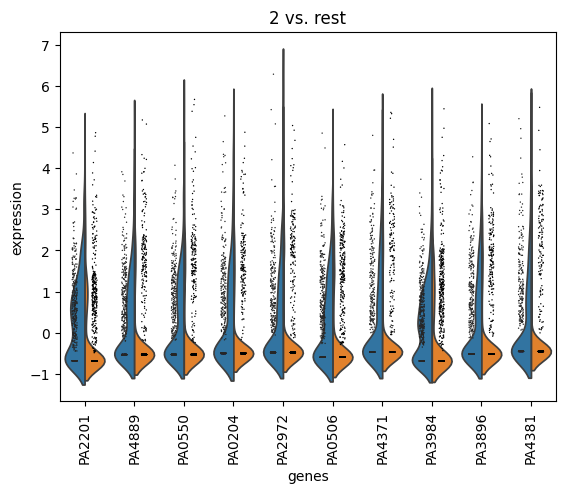

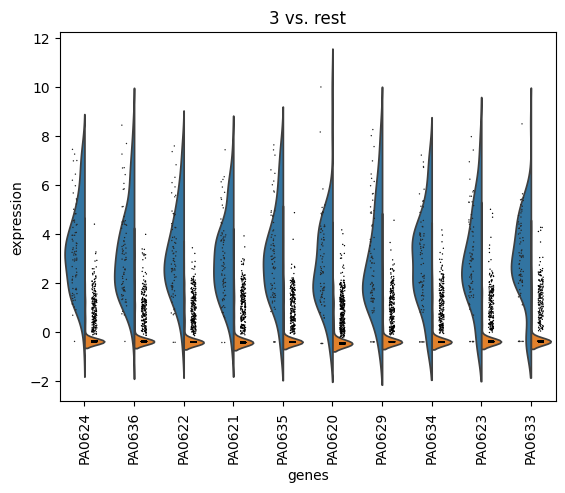

In [68]:
nclust = len(np.unique(data_all_pca.obs["leiden_opt"]))

for i in range(nclust):
    sc.pl.rank_genes_groups_violin(data_all_pca, groups=str(i), n_genes=10)

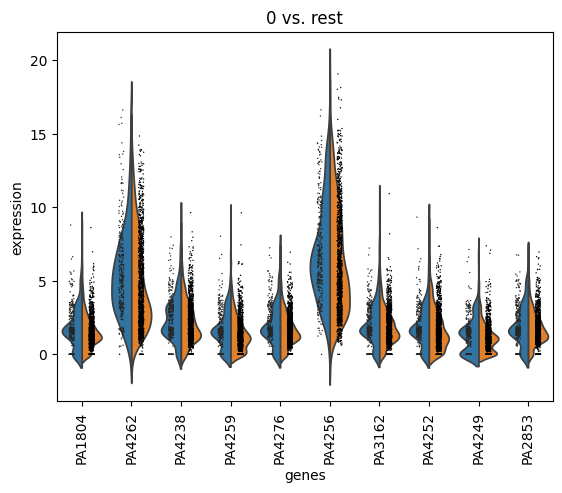

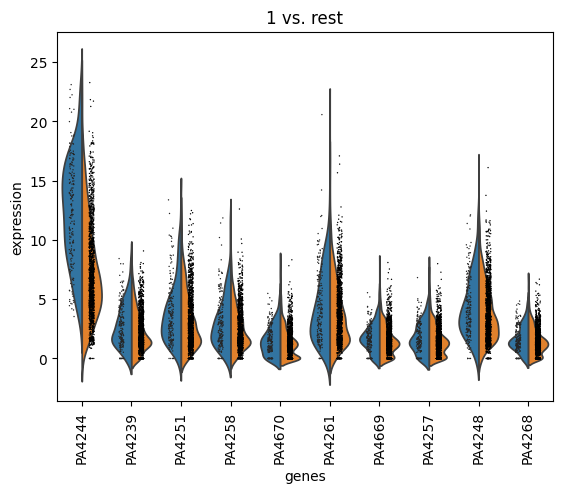

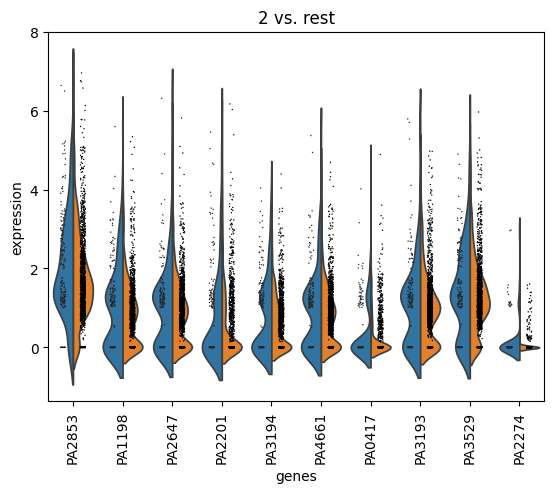

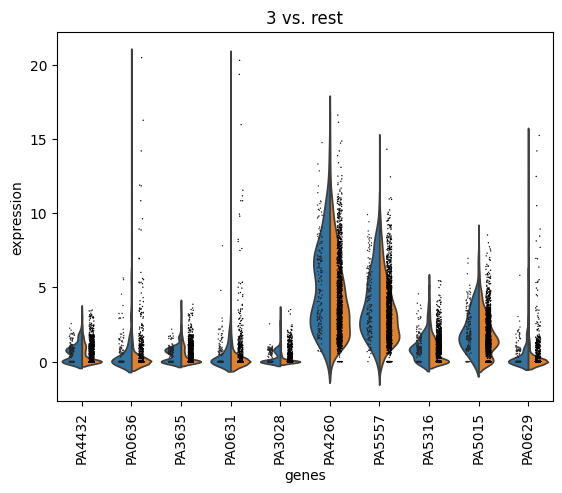

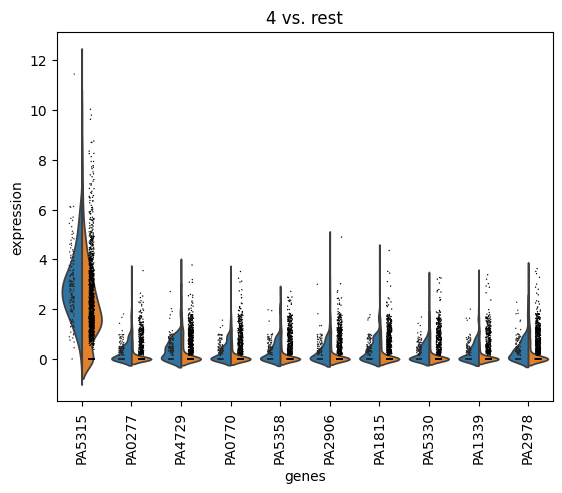

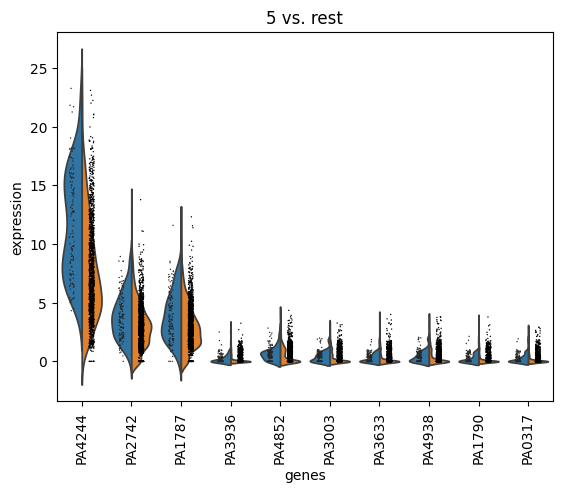

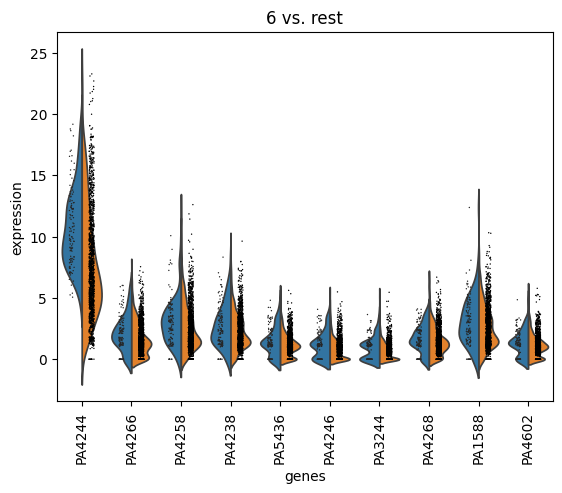

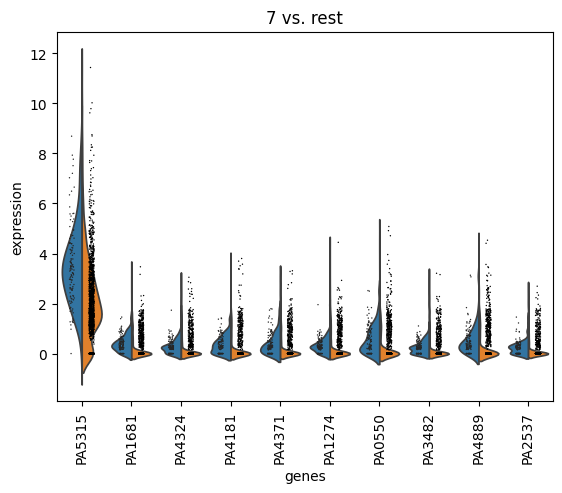

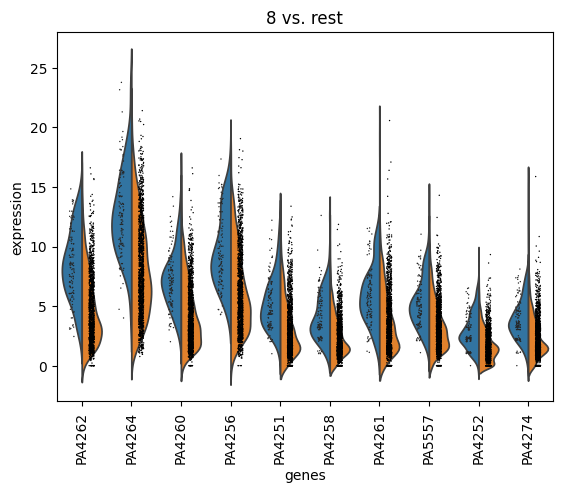

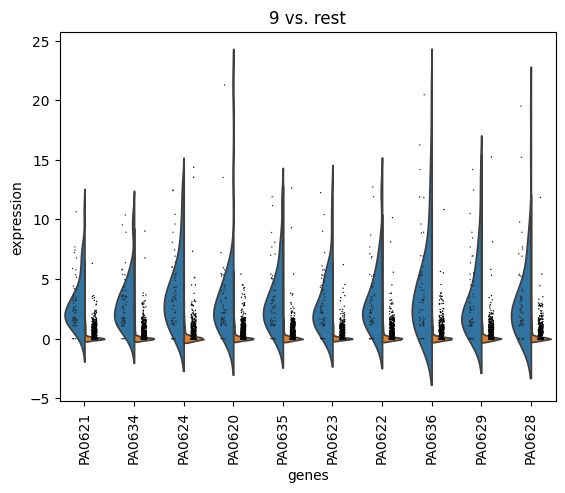

In [59]:
nclust = len(np.unique(data_counts.obs["leiden_opt"]))

for i in range(nclust):
    sc.pl.rank_genes_groups_violin(data_counts, groups=str(i), n_genes=10)